In [41]:
import gzip
f = gzip.open('./fullDataset/train-images-idx3-ubyte.gz','r')

In [24]:
f

<gzip _io.BufferedReader name='t10k-images-idx3-ubyte.gz' 0x209150b0be0>

In [42]:
image_size = 28
num_images = 60000

import numpy as np
f.read(16)
buf = f.read(image_size * image_size * num_images)
data = np.frombuffer(buf, dtype=np.uint8).astype(np.float32)
data = data.reshape(num_images, image_size, image_size, 1)

In [43]:
len(data)

60000

<ipython-input-44-7ad6df37a1e7>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(280/my_dpi, 280/my_dpi), dpi=my_dpi)
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\Users\Corey\anaconda3\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-44-7ad6df37a1e7>", line 8, in <module>
    plt.imshow(image)
  File "C:\Users\Corey\anaconda3\envs\tf\lib\site-packages\matplotlib\pyplot.py", line 2724, in imshow
    __ret = gca().imshow(
  File "C:\Users\Corey\anaconda3\envs\tf\lib\site-packages\matplotlib\__init__.py", line 1447, in inner
    return func(ax, *map(sanitize_sequence, args), **kwargs)
  File "C:\Users\Corey\anaconda3\envs\tf\lib\site-packages\matplotlib\axes\_axes.py", line 5527, in imshow
    im.set_clip_path(self.patch)
  File "C:\Users\Corey\anaconda3\envs\tf\lib\site-packages\matplotlib\artist.py", line 753, in set_clip_path
    self.clipbox = TransformedBbox(Bbox.unit(),
  File "C:\Users\Corey\anaconda3\envs\tf\lib\site-packages\matplotlib\transforms.py", line 1036, in __init__
    self.s

TypeError: object of type 'NoneType' has no len()

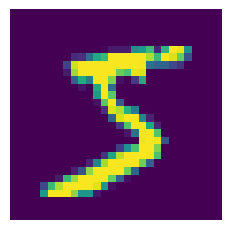

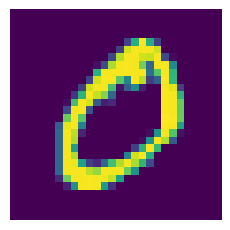

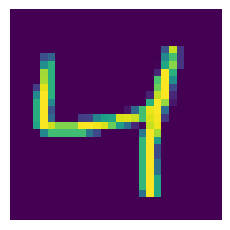

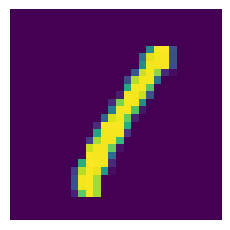

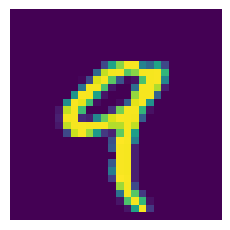

...

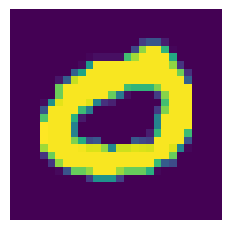

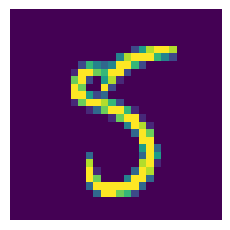

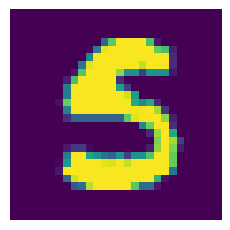

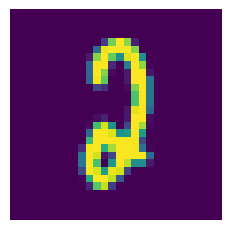

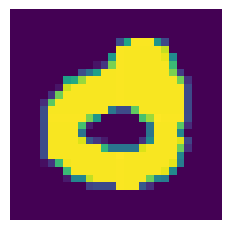

Error in callback <function flush_figures at 0x00000209150AF5E0> (for post_execute):


KeyboardInterrupt: 

In [44]:
import matplotlib.pyplot as plt
my_dpi=96
for i in range(0, 10): #len(data)
    fig_name = "train_" + str(i) + ".png"
    image = np.asarray(data[i]).squeeze()
    plt.figure(figsize=(280/my_dpi, 280/my_dpi), dpi=my_dpi)
    plt.axis('off')
    plt.imshow(image)
    plt.imsave("./train_img/" + fig_name, arr=image, cmap='gray', format='png')


In [19]:
image = np.asarray(data[2]).squeeze()
plt.imshow(image)
plt.show()
fig_name = "train_" + str(2) + ".png"
print(fig_name)
plt.savefig("./train_img/" + fig_name)


train_2.png


<Figure size 432x288 with 0 Axes>

In [31]:
f = gzip.open('./fullDataset/t10k-labels-idx1-ubyte.gz','r')
f.read(8)
for i in range(0,100):   
    buf = f.read(1)
    labels = np.frombuffer(buf, dtype=np.uint8).astype(np.int64)
    print(labels)

[7]
[2]
[1]
[0]
[4]
[1]
[4]
[9]
[5]
[9]
[0]
[6]
[9]
[0]
[1]
[5]
[9]
[7]
[3]
[4]
[9]
[6]
[6]
[5]
[4]
[0]
[7]
[4]
[0]
[1]
[3]
[1]
[3]
[4]
[7]
[2]
[7]
[1]
[2]
[1]
[1]
[7]
[4]
[2]
[3]
[5]
[1]
[2]
[4]
[4]
[6]
[3]
[5]
[5]
[6]
[0]
[4]
[1]
[9]
[5]
[7]
[8]
[9]
[3]
[7]
[4]
[6]
[4]
[3]
[0]
[7]
[0]
[2]
[9]
[1]
[7]
[3]
[2]
[9]
[7]
[7]
[6]
[2]
[7]
[8]
[4]
[7]
[3]
[6]
[1]
[3]
[6]
[9]
[3]
[1]
[4]
[1]
[7]
[6]
[9]


In [1]:
import os
import cv2
import numpy as np

# train_image = './fullDataset/train-images-idx3-ubyte'
train_label = './fullDataset/train-labels-idx1-ubyte'
# test_image = './fullDataset/t10k-images-idx3-ubyte'
# test_label = './fullDataset/t10k-labels-idx1-ubyte'


In [7]:

for f in [train_image, train_label, test_image, test_label]:
    os.system('wget --no-check-certificate http://yann.lecun.com/exdb/mnist/%s.gz' % (f,))


In [8]:
for f in [train_image, train_label, test_image, test_label]:
    os.system('gunzip %s.gz' % (f,))


In [9]:
for image_f, label_f in [(train_image, train_label), (test_image, test_label)]:
	with open(image_f, 'rb') as f:
		images = f.read()
	with open(label_f, 'rb') as f:
		labels = f.read()
	
	images = [ord(d) for d in images[16:]]
	images = np.array(images, dtype=np.uint8)
	images = images.reshape((-1,28,28))
	
	outdir = image_f + "_folder"
	if not os.path.exists(outdir):
		os.mkdir(outdir)
	for k,image in enumerate(images):
		cv2.imwrite(os.path.join(outdir, '%05d.png' % (k,)), image)
	
	labels = [outdir + '/%05d.png %d' % (k, ord(l)) for k,l in enumerate(labels[8:])]
	with open('%s.txt' % label_f, 'w') as f:
		f.write(os.linesep.join(labels))

FileNotFoundError: [Errno 2] No such file or directory: 'train-images-idx3-ubyte'